In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [2]:
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
    )

In [3]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


In [4]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),

            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [6]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


In [7]:
#get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    return torch.randn(n_samples,z_dim,device = device)

In [8]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


In [9]:
# get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2, inplace = True)
    )

In [10]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)
    
    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5

test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


In [11]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            nn.Linear(hidden_dim, 1)
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [12]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)
    
    # Make sure there's no sigmoid
    assert test_input.max() > 1
    assert test_input.min() < -1

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


In [13]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=False, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

### DO NOT EDIT ###
device = 'cuda'

In [14]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [15]:
# get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake.detach())
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
    disc_real_pred = disc(real)
    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
    disc_loss = (disc_fake_loss + disc_real_loss) / 2
    return disc_loss

In [16]:
def test_disc_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_disc_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = lambda x: x.mean(1)[:, None]
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, z_dim)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(disc_loss.mean() - 0.5) < 1e-5)
    
    gen = torch.ones_like
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, z_dim)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)
    
    gen = lambda x: torch.ones(num_images, 10)
    disc = lambda x: x.mean(1)[:, None] + 10
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 10)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean() - 5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Linear(64, 1, bias=False)
    real = torch.ones(num_images, 64) * 0.5
    disc.weight.data = torch.ones_like(disc.weight.data) * 0.5
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    criterion = lambda x, y: torch.sum(x) + torch.sum(y)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean()
    disc_loss.backward()
    assert torch.isclose(torch.abs(disc.weight.grad.mean() - 11.25), torch.tensor(3.75))
    
def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")

Success!


In [17]:
#get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake)
    gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
    return gen_loss

In [18]:
def test_gen_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_gen_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


Epoch 1, step 500: Generator loss: 1.3403175017833704, discriminator loss: 0.43161133104562727


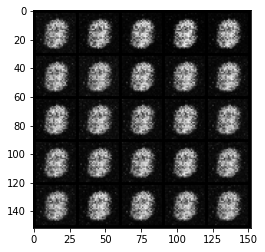

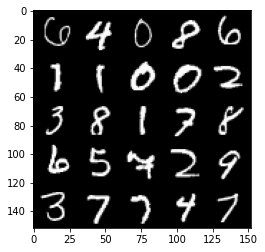

Epoch 2, step 1000: Generator loss: 1.6086993668079381, discriminator loss: 0.31544394302368206


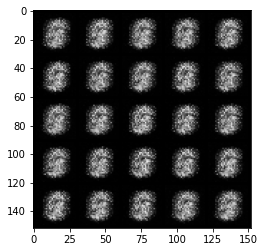

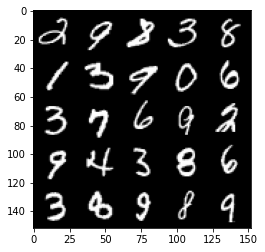

Epoch 3, step 1500: Generator loss: 1.8639570102691658, discriminator loss: 0.19304785257577894


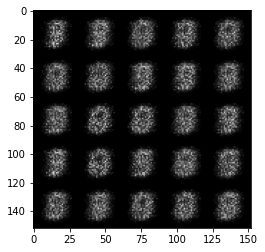

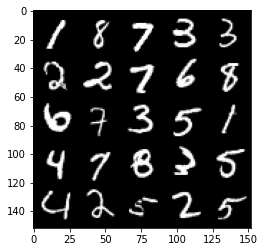

Epoch 4, step 2000: Generator loss: 1.6369805800914783, discriminator loss: 0.2305377663969993


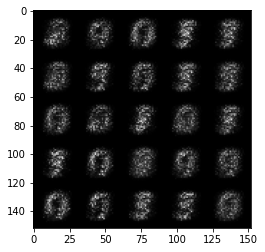

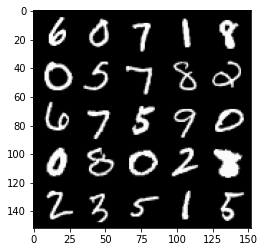

Epoch 5, step 2500: Generator loss: 1.561806798934936, discriminator loss: 0.23509372812509552


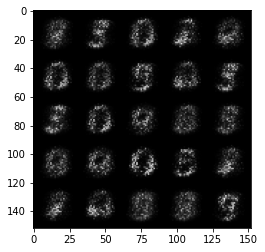

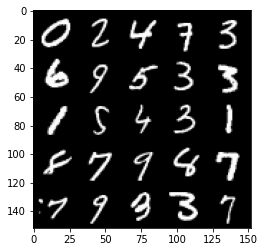

Epoch 6, step 3000: Generator loss: 1.7765100865364074, discriminator loss: 0.20005132803320905


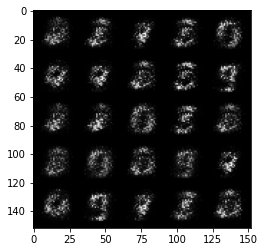

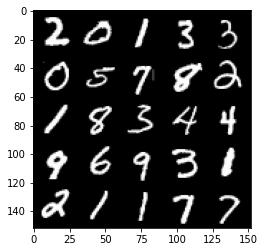

Epoch 7, step 3500: Generator loss: 2.23209523534775, discriminator loss: 0.13832324813306332


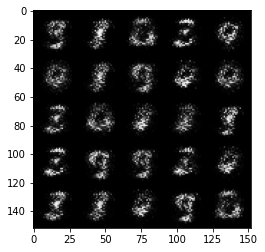

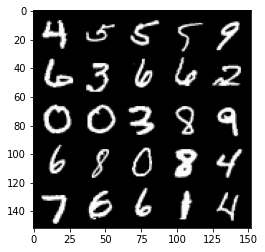

Epoch 8, step 4000: Generator loss: 2.7146217989921584, discriminator loss: 0.10010343924164773


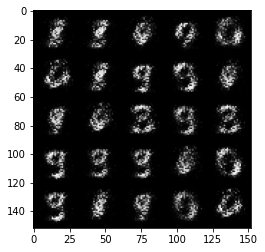

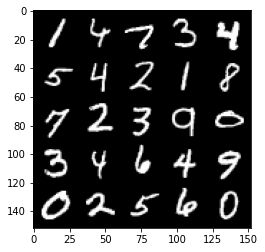

Epoch 9, step 4500: Generator loss: 2.945994213581088, discriminator loss: 0.09676187959313393


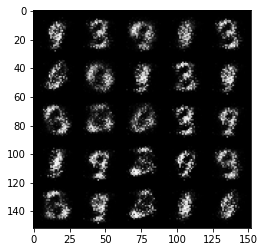

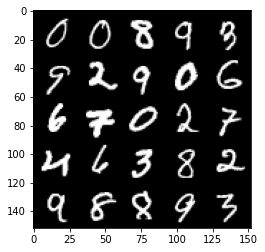

Epoch 10, step 5000: Generator loss: 3.18794005346298, discriminator loss: 0.09595141573250301


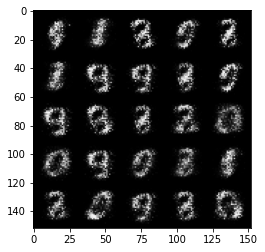

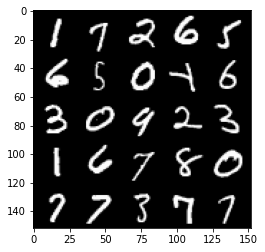

Epoch 11, step 5500: Generator loss: 3.233520306587215, discriminator loss: 0.1063403138890863


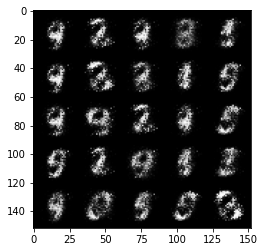

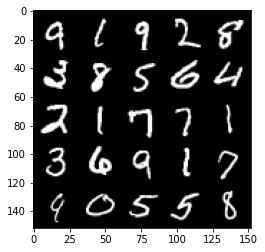

Epoch 12, step 6000: Generator loss: 3.41152914094925, discriminator loss: 0.08526678399741658


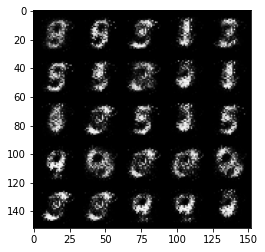

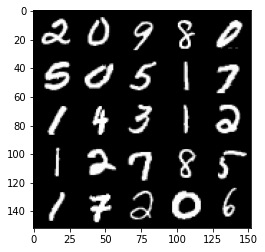

Epoch 13, step 6500: Generator loss: 3.710195966243741, discriminator loss: 0.07329667987674479


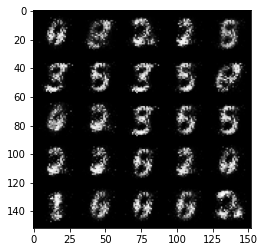

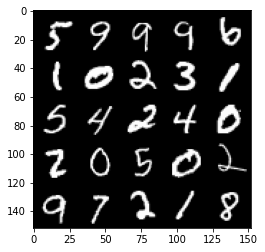

Epoch 14, step 7000: Generator loss: 3.7302067365646367, discriminator loss: 0.07032002714276321


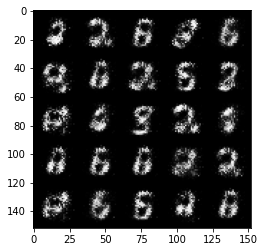

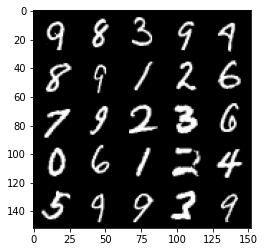

Epoch 15, step 7500: Generator loss: 3.772979414463044, discriminator loss: 0.06956115906685593


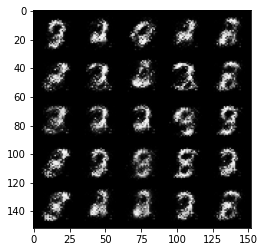

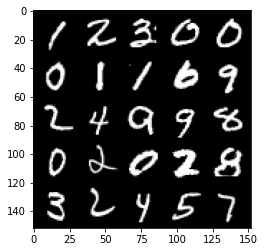

Epoch 17, step 8000: Generator loss: 3.723491384506225, discriminator loss: 0.07381756868958471


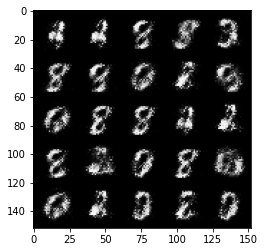

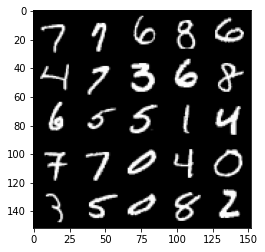

Epoch 18, step 8500: Generator loss: 3.7081343464851355, discriminator loss: 0.07659642655402422


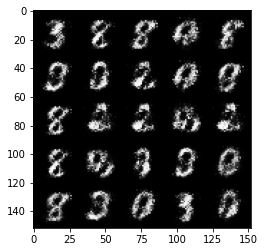

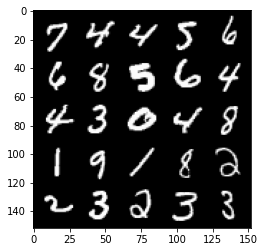

Epoch 19, step 9000: Generator loss: 3.6957303204536447, discriminator loss: 0.07361400394141675


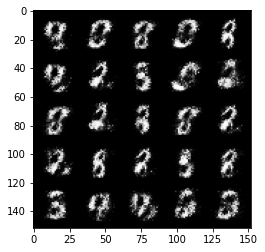

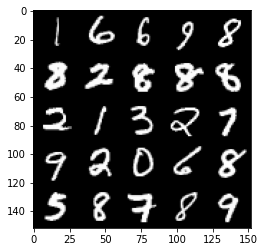

Epoch 20, step 9500: Generator loss: 3.835341970920565, discriminator loss: 0.07134246353060013


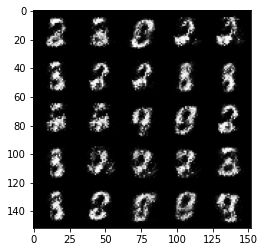

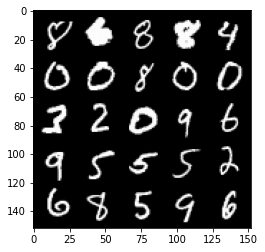

Epoch 21, step 10000: Generator loss: 3.857846506595611, discriminator loss: 0.07438519877195364


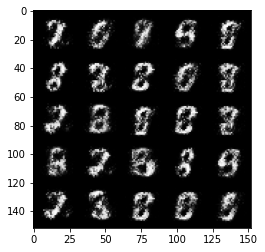

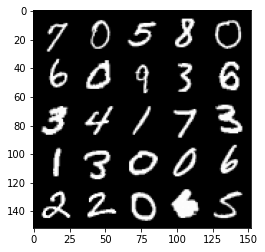

Epoch 22, step 10500: Generator loss: 3.822985698699953, discriminator loss: 0.08961558128148313


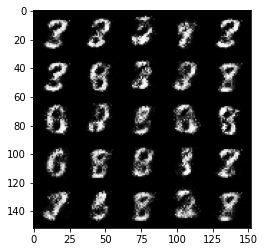

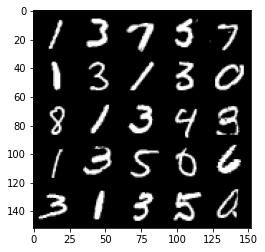

Epoch 23, step 11000: Generator loss: 3.7382166056632986, discriminator loss: 0.08902711315453055


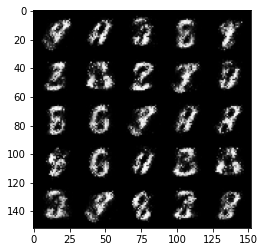

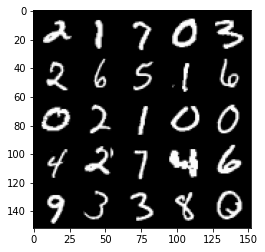

Epoch 24, step 11500: Generator loss: 3.6862714576721207, discriminator loss: 0.09074712058901782


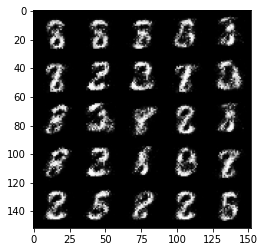

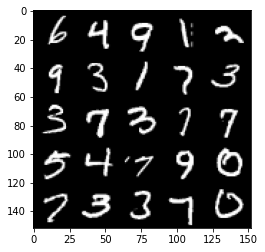

Epoch 25, step 12000: Generator loss: 3.611105615615844, discriminator loss: 0.08878767094016066


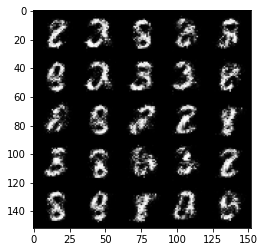

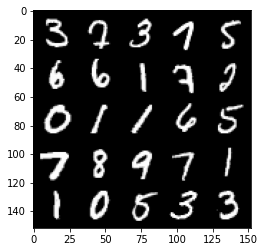

Epoch 26, step 12500: Generator loss: 3.521155156135559, discriminator loss: 0.09724732343852528


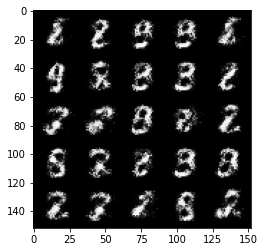

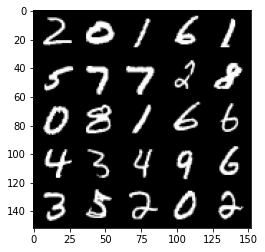

Epoch 27, step 13000: Generator loss: 3.6715754041671733, discriminator loss: 0.0903512057736516


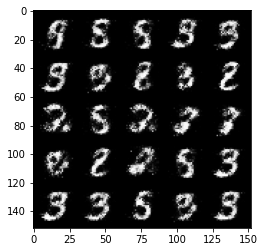

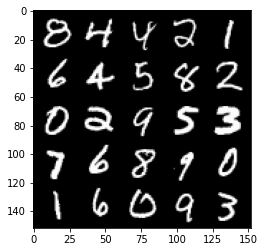

Epoch 28, step 13500: Generator loss: 3.6458715839386, discriminator loss: 0.09996632411330938


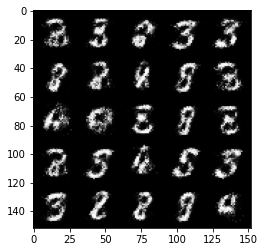

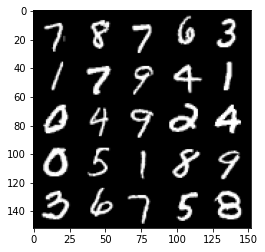

Epoch 29, step 14000: Generator loss: 3.6693327293396036, discriminator loss: 0.10298200009763246


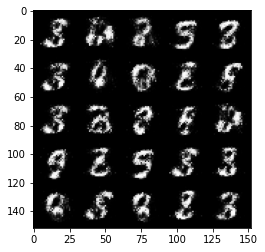

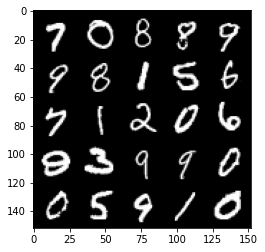

Epoch 30, step 14500: Generator loss: 3.5670233378410368, discriminator loss: 0.10828002285957337


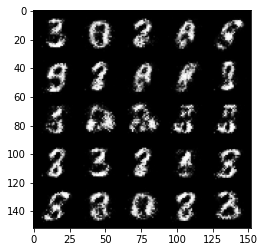

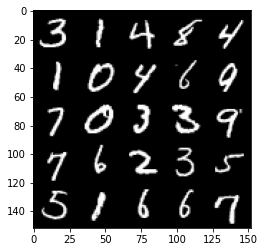

Epoch 31, step 15000: Generator loss: 3.5296052899360646, discriminator loss: 0.10938592868298296


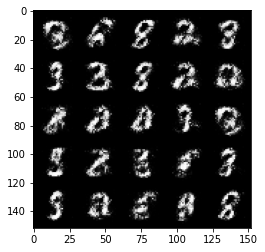

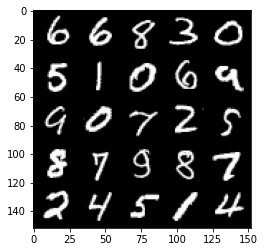

Epoch 33, step 15500: Generator loss: 3.570313170433047, discriminator loss: 0.10934431137144565


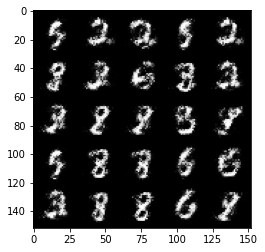

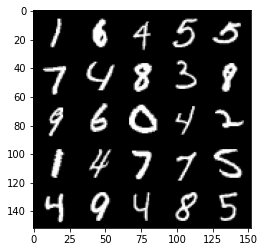

Epoch 34, step 16000: Generator loss: 3.5408763985633827, discriminator loss: 0.12309249900281435


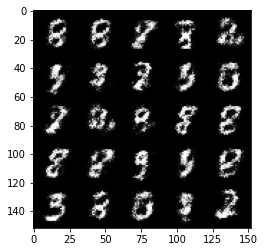

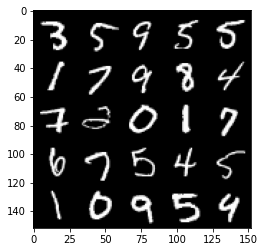

Epoch 35, step 16500: Generator loss: 3.378683327198029, discriminator loss: 0.14702903798222544


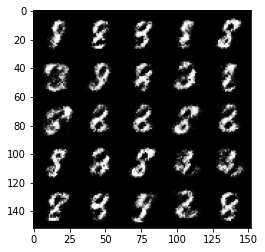

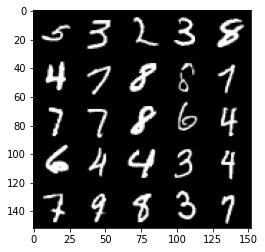

Epoch 36, step 17000: Generator loss: 3.2590688862800596, discriminator loss: 0.14546209190785903


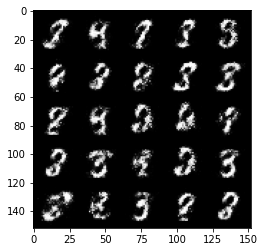

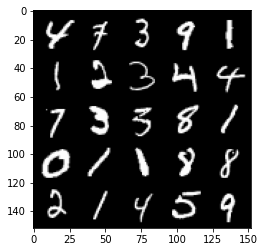

Epoch 37, step 17500: Generator loss: 3.2705807032585175, discriminator loss: 0.13946923722326746


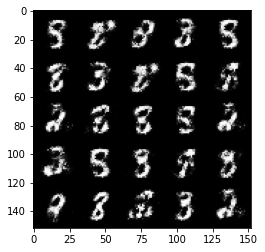

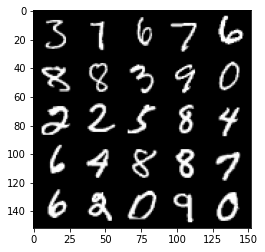

Epoch 38, step 18000: Generator loss: 3.3776695141792286, discriminator loss: 0.1313984843194485


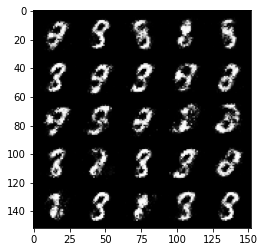

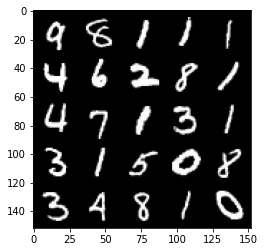

Epoch 39, step 18500: Generator loss: 3.365532435417174, discriminator loss: 0.14115842521190644


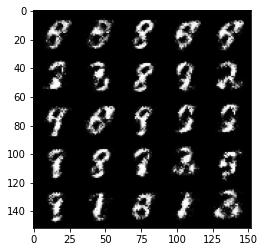

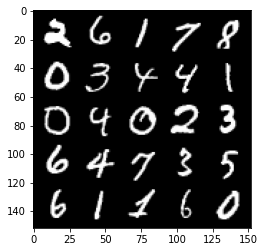

Epoch 40, step 19000: Generator loss: 3.351708904266356, discriminator loss: 0.1530340213626623


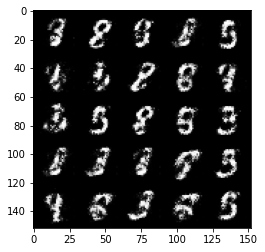

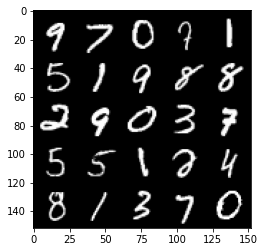

Epoch 41, step 19500: Generator loss: 3.240110887050627, discriminator loss: 0.17242015339434147


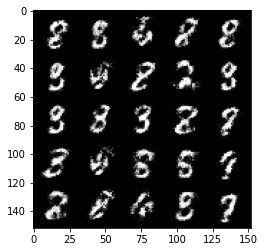

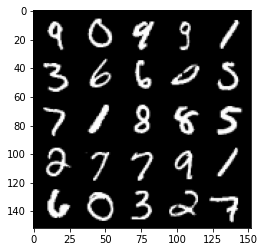

Epoch 42, step 20000: Generator loss: 3.1652147707939142, discriminator loss: 0.17593245264887797


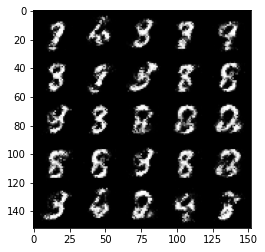

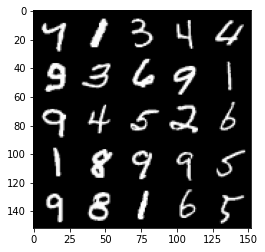

Epoch 43, step 20500: Generator loss: 3.001592497825626, discriminator loss: 0.18968147619068607


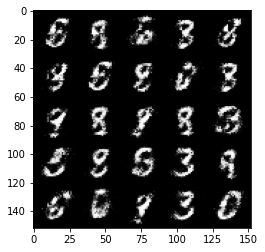

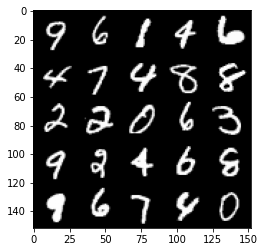

Epoch 44, step 21000: Generator loss: 2.9304174995422363, discriminator loss: 0.20363345342874534


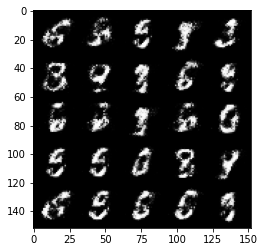

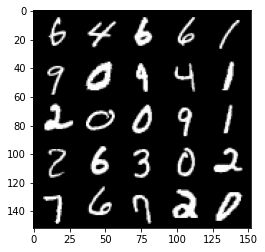

Epoch 45, step 21500: Generator loss: 2.926116432666777, discriminator loss: 0.18876828965544704


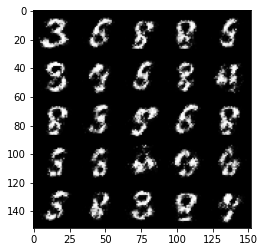

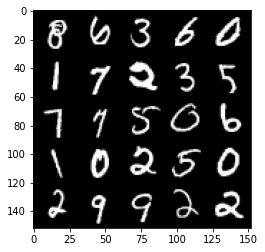

Epoch 46, step 22000: Generator loss: 2.9664352774620024, discriminator loss: 0.1925451312810183


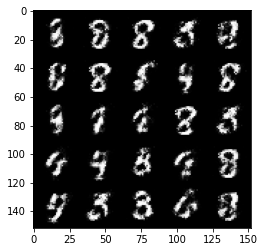

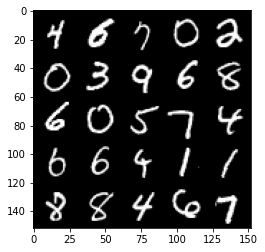

Epoch 47, step 22500: Generator loss: 2.7054228672981258, discriminator loss: 0.21551276220381277


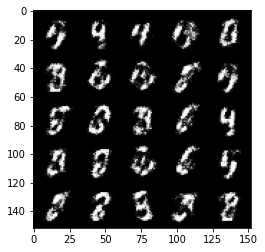

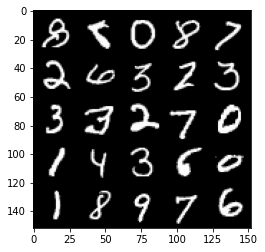

Epoch 49, step 23000: Generator loss: 2.959918069839477, discriminator loss: 0.18203174024820332


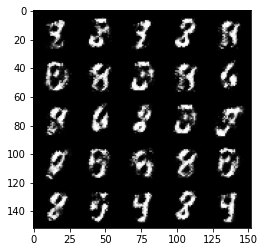

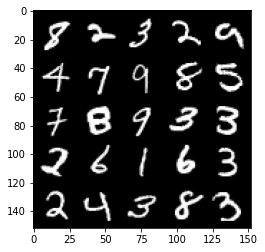

Epoch 50, step 23500: Generator loss: 2.776726538181302, discriminator loss: 0.20536826355755322


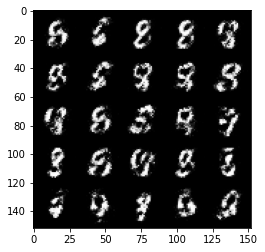

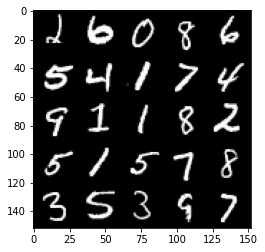

Epoch 51, step 24000: Generator loss: 2.8680632457733126, discriminator loss: 0.18566113843023774


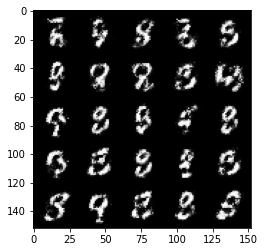

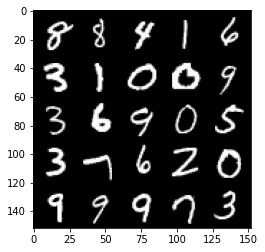

Epoch 52, step 24500: Generator loss: 2.890041285514832, discriminator loss: 0.18539076727628698


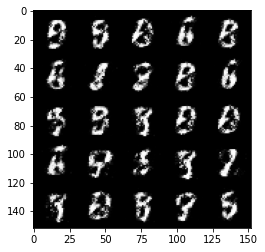

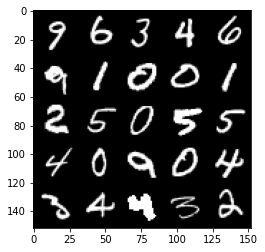

Epoch 53, step 25000: Generator loss: 2.801358099937437, discriminator loss: 0.19376210352778417


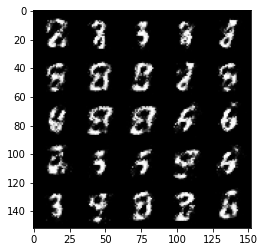

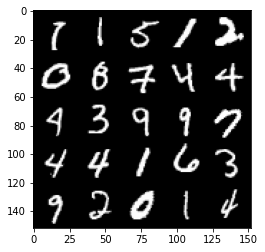

Epoch 54, step 25500: Generator loss: 2.8507818236351015, discriminator loss: 0.19509941756725313


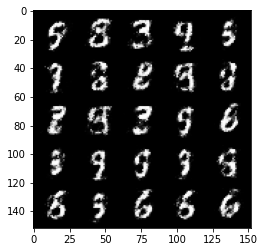

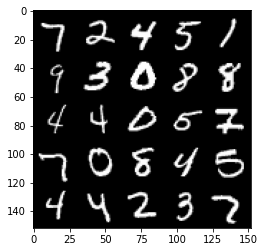

Epoch 55, step 26000: Generator loss: 2.911695562362672, discriminator loss: 0.17470683358609687


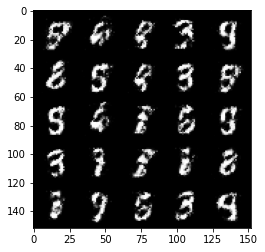

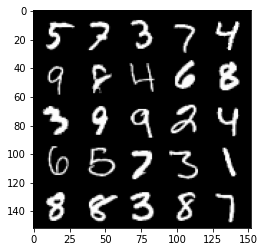

Epoch 56, step 26500: Generator loss: 3.0083080873489365, discriminator loss: 0.18126323927938948


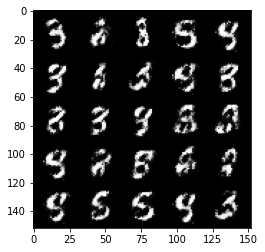

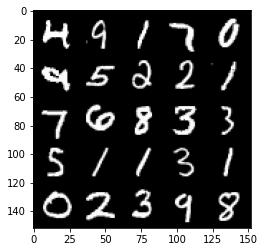

Epoch 57, step 27000: Generator loss: 2.874641940593718, discriminator loss: 0.1912518730461599


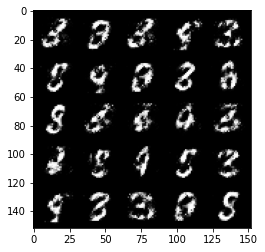

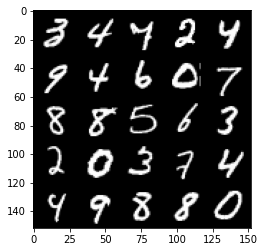

Epoch 58, step 27500: Generator loss: 2.790748363018038, discriminator loss: 0.20251870232820499


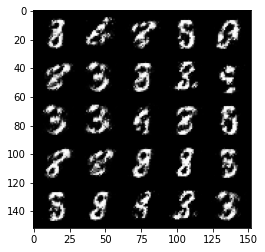

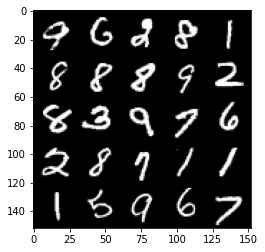

Epoch 59, step 28000: Generator loss: 2.632121306419375, discriminator loss: 0.22049159574508662


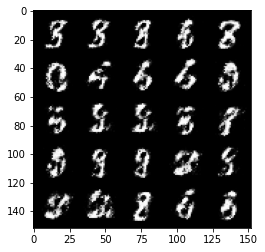

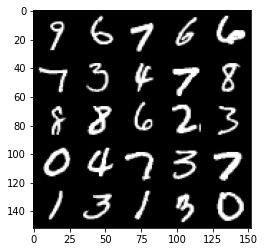

Epoch 60, step 28500: Generator loss: 2.7755173778533946, discriminator loss: 0.2031482705473897


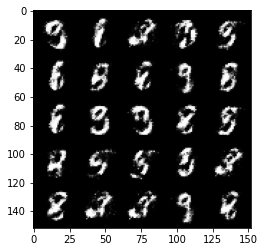

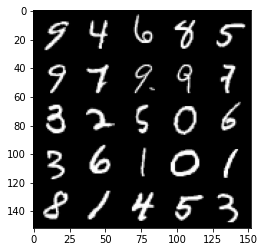

Epoch 61, step 29000: Generator loss: 2.629724225521088, discriminator loss: 0.2240276170074939


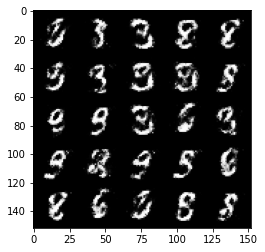

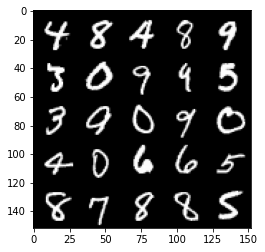

Epoch 62, step 29500: Generator loss: 2.654493077754976, discriminator loss: 0.20947094109654438


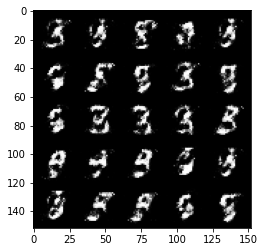

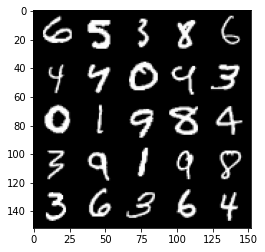

Epoch 63, step 30000: Generator loss: 2.569106288433076, discriminator loss: 0.22770388785004606


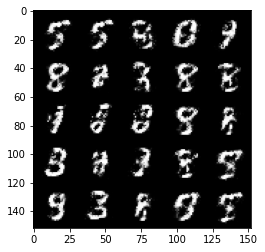

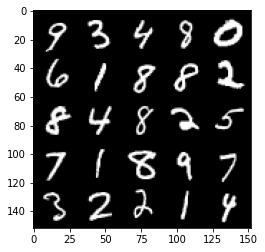

Epoch 65, step 30500: Generator loss: 2.611171062469483, discriminator loss: 0.22081216889619817


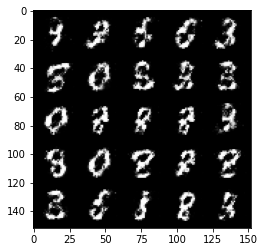

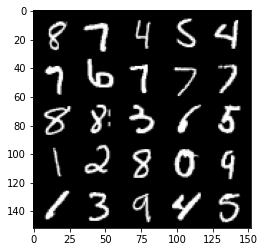

Epoch 66, step 31000: Generator loss: 2.689270193576814, discriminator loss: 0.2066581564545632


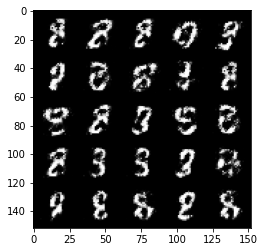

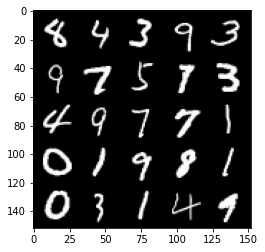

Epoch 67, step 31500: Generator loss: 2.6998287830352785, discriminator loss: 0.21566066882014298


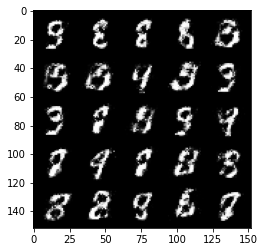

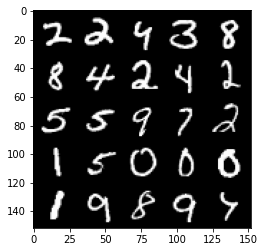

Epoch 68, step 32000: Generator loss: 2.498822384834288, discriminator loss: 0.24031543242931355


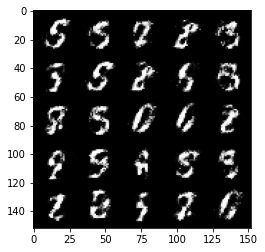

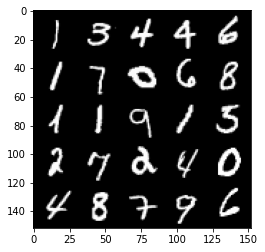

Epoch 69, step 32500: Generator loss: 2.6698339667320248, discriminator loss: 0.2183404600620269


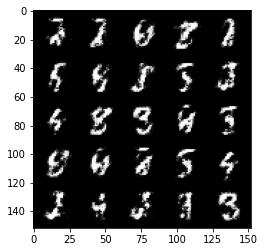

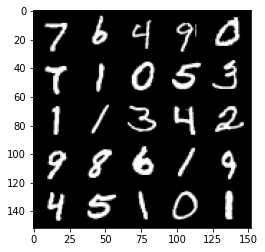

Epoch 70, step 33000: Generator loss: 2.524005107402801, discriminator loss: 0.24815750414133073


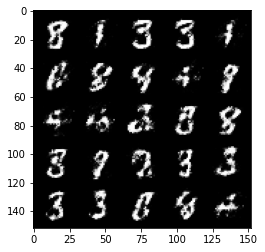

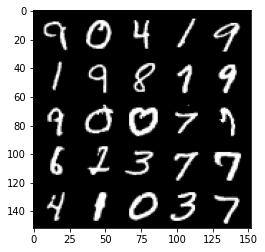

Epoch 71, step 33500: Generator loss: 2.3755961332321167, discriminator loss: 0.27213656237721434


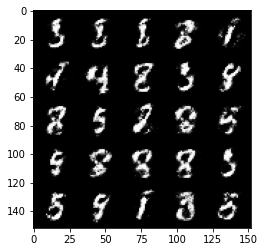

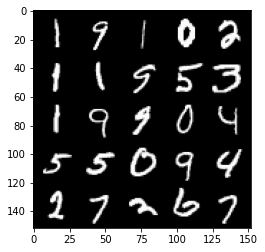

Epoch 72, step 34000: Generator loss: 2.2690254721641536, discriminator loss: 0.2674085101783276


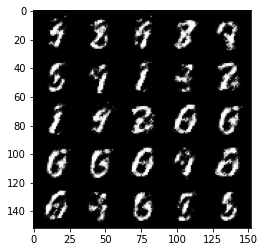

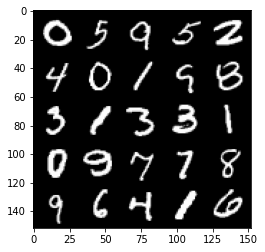

Epoch 73, step 34500: Generator loss: 2.4746073408126814, discriminator loss: 0.2460474929809569


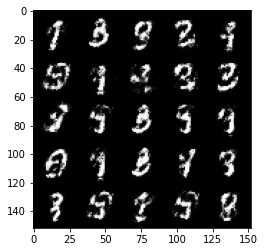

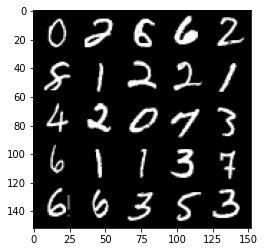

Epoch 74, step 35000: Generator loss: 2.3337182629108426, discriminator loss: 0.26500500017404555


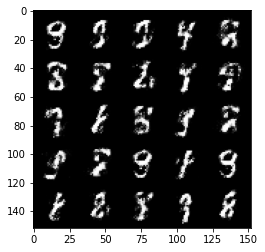

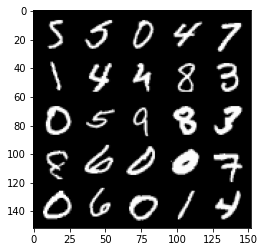

Epoch 75, step 35500: Generator loss: 2.4112555999755863, discriminator loss: 0.24542016598582253


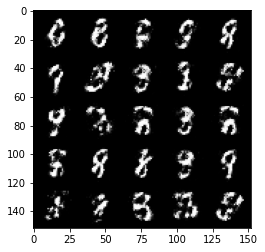

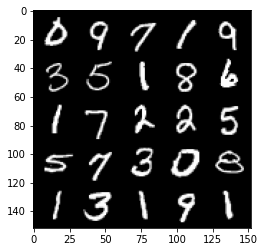

Epoch 76, step 36000: Generator loss: 2.3998774747848506, discriminator loss: 0.26083857274055494


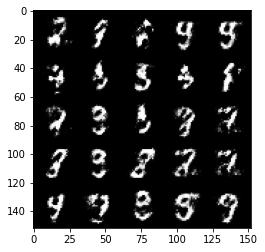

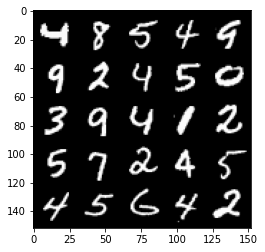

Epoch 77, step 36500: Generator loss: 2.339901431560517, discriminator loss: 0.2638611739277839


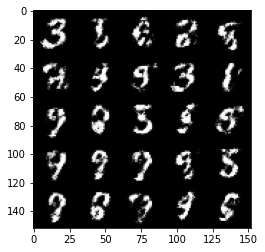

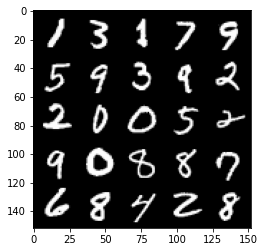

Epoch 78, step 37000: Generator loss: 2.2230666868686657, discriminator loss: 0.2853654527664186


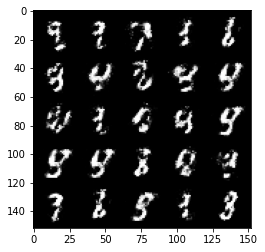

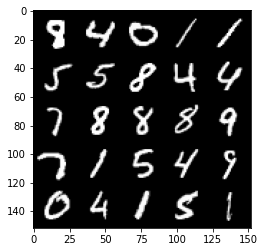

Epoch 79, step 37500: Generator loss: 2.2524927585124974, discriminator loss: 0.27386911275982867


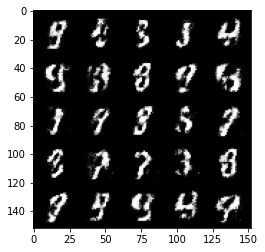

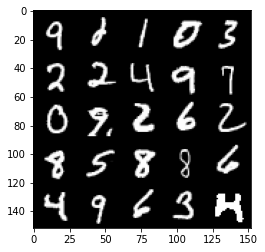

Epoch 81, step 38000: Generator loss: 2.2999926247596747, discriminator loss: 0.27129489693045616


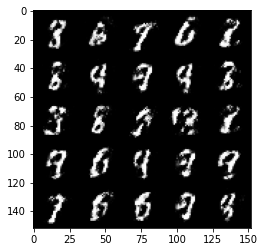

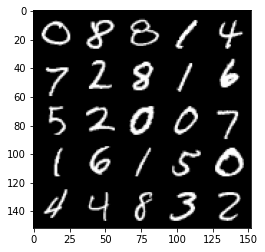

Epoch 82, step 38500: Generator loss: 2.230047966480254, discriminator loss: 0.29147792315483084


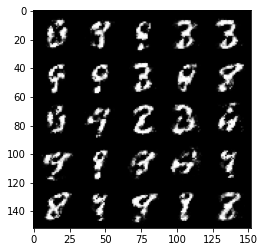

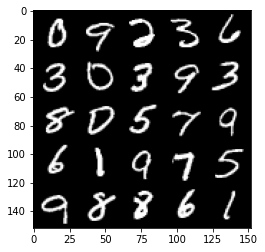

Epoch 83, step 39000: Generator loss: 2.1682242593765273, discriminator loss: 0.29062584307789807


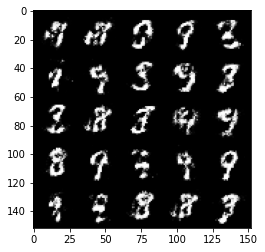

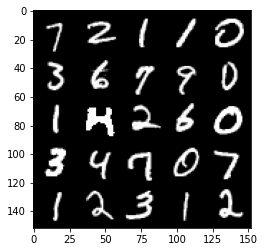

Epoch 84, step 39500: Generator loss: 2.1949344973564155, discriminator loss: 0.29218565398454666


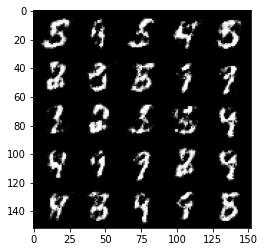

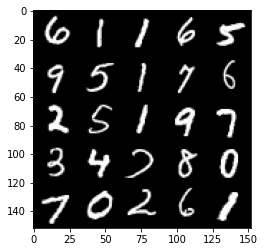

Epoch 85, step 40000: Generator loss: 2.051030211925506, discriminator loss: 0.31275047016143814


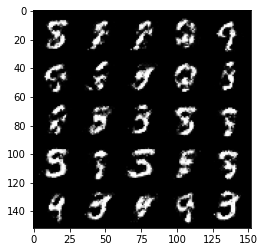

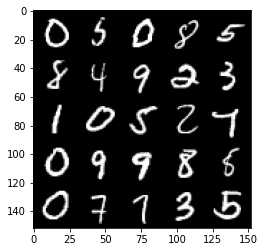

Epoch 86, step 40500: Generator loss: 2.078392621755601, discriminator loss: 0.3104498314261435


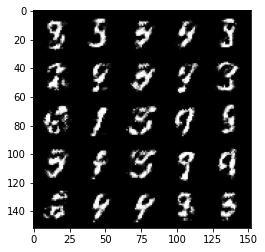

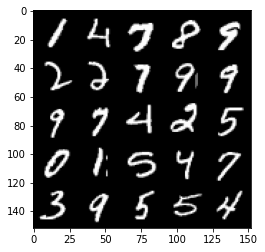

Epoch 87, step 41000: Generator loss: 2.069046023130414, discriminator loss: 0.3054656741321088


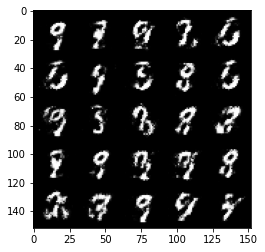

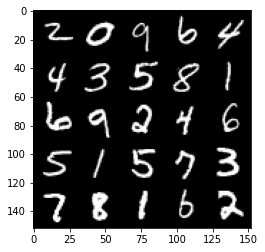

Epoch 88, step 41500: Generator loss: 2.1501329808235146, discriminator loss: 0.28245783537626284


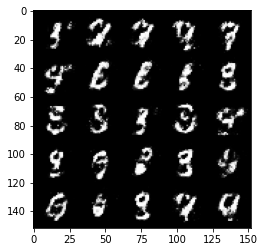

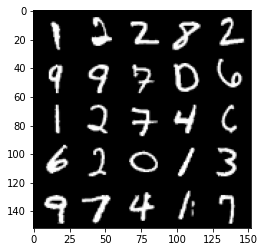

Epoch 89, step 42000: Generator loss: 2.0810560734272014, discriminator loss: 0.3142775133252145


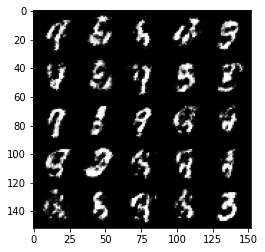

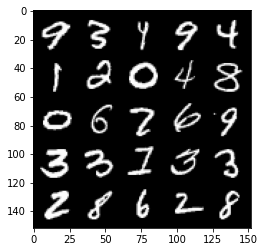

Epoch 90, step 42500: Generator loss: 2.122862205266953, discriminator loss: 0.2936620688736439


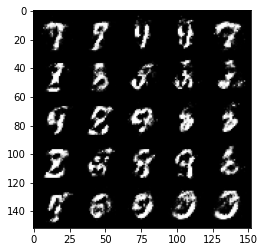

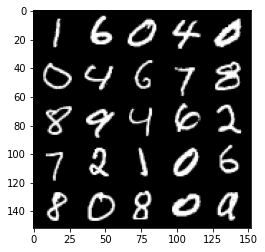

Epoch 91, step 43000: Generator loss: 1.9880560500621798, discriminator loss: 0.33210796278715127


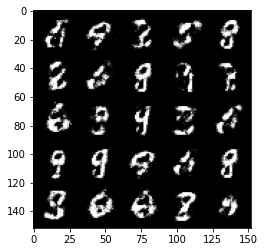

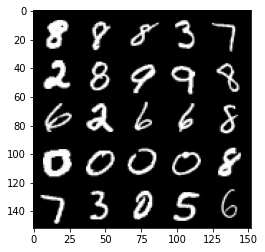

Epoch 92, step 43500: Generator loss: 2.0543249931335446, discriminator loss: 0.31800618982315043


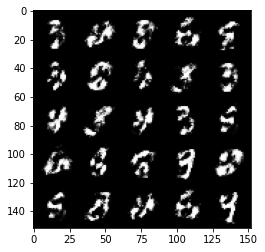

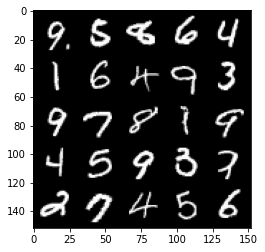

Epoch 93, step 44000: Generator loss: 1.980147548675536, discriminator loss: 0.32676974749565124


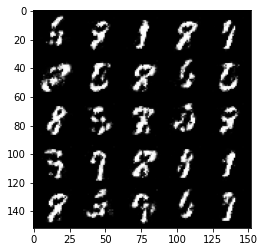

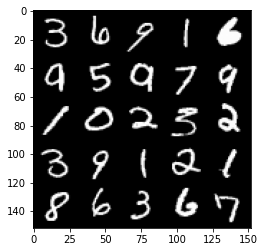

Epoch 94, step 44500: Generator loss: 2.117095807075498, discriminator loss: 0.3061546868383887


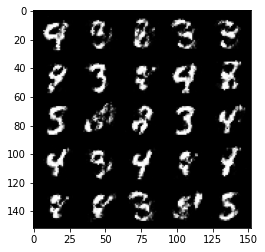

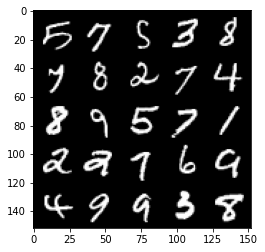

Epoch 95, step 45000: Generator loss: 1.9720064358711222, discriminator loss: 0.33152141943573926


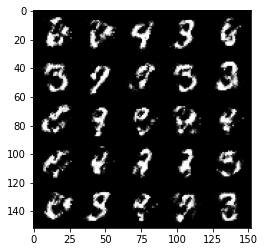

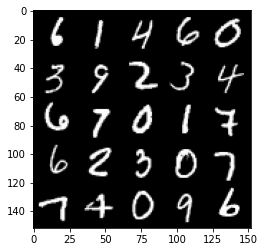

Epoch 97, step 45500: Generator loss: 2.043385387659072, discriminator loss: 0.3078127490282059


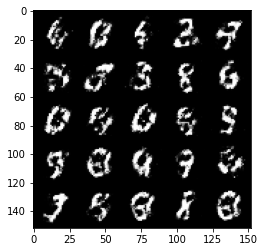

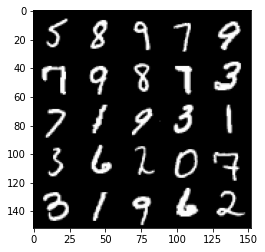

Epoch 98, step 46000: Generator loss: 1.917629502534866, discriminator loss: 0.3401428822577004


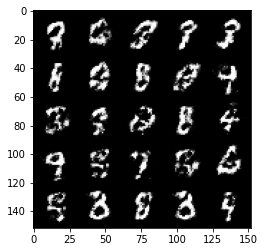

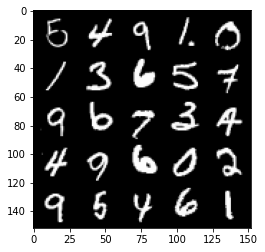

Epoch 99, step 46500: Generator loss: 1.9238320863246927, discriminator loss: 0.32660242569446535


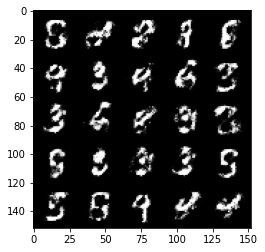

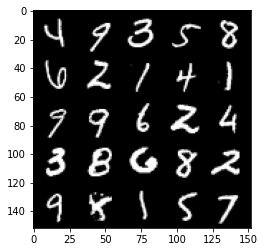

Epoch 100, step 47000: Generator loss: 1.9679139547348035, discriminator loss: 0.3256798380613324


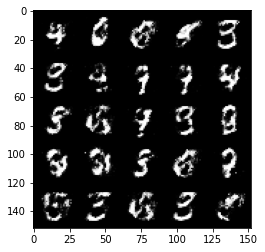

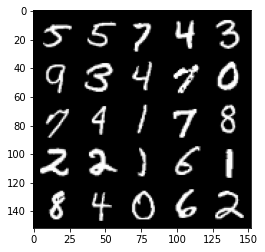

Epoch 101, step 47500: Generator loss: 1.912086647272111, discriminator loss: 0.33926204973459234


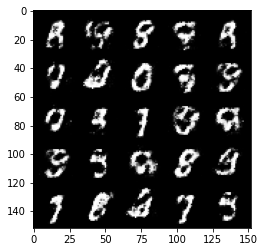

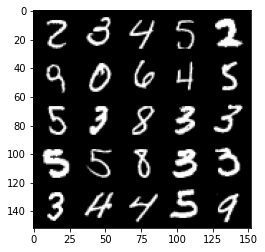

Epoch 102, step 48000: Generator loss: 1.8473979206085196, discriminator loss: 0.3450948042869565


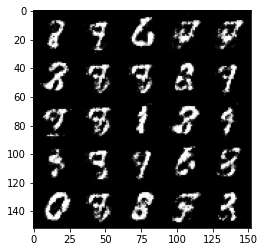

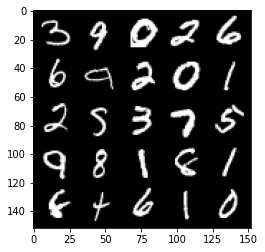

Epoch 103, step 48500: Generator loss: 1.9020792801380164, discriminator loss: 0.3356138640642165


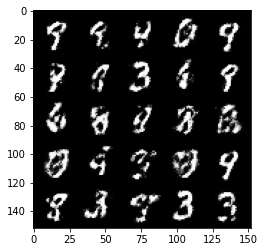

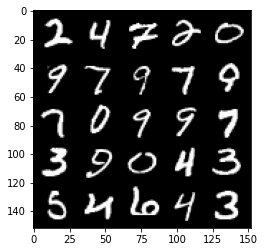

Epoch 104, step 49000: Generator loss: 1.8751623506546022, discriminator loss: 0.34114498987793923


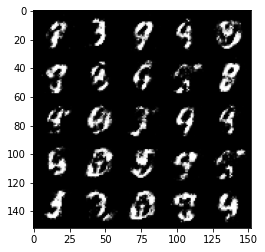

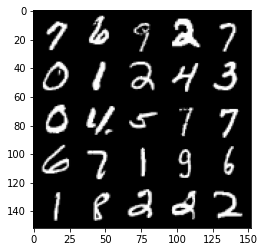

Epoch 105, step 49500: Generator loss: 1.8852775833606723, discriminator loss: 0.3443363990485667


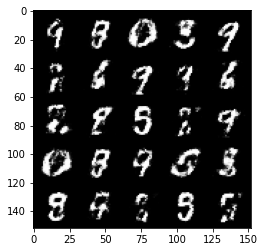

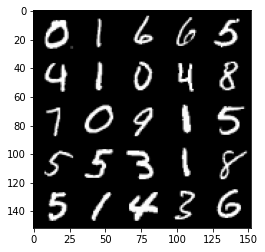

Epoch 106, step 50000: Generator loss: 1.9372340507507322, discriminator loss: 0.32637006050348316


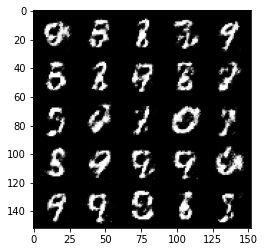

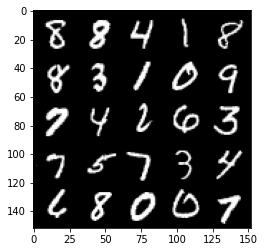

Epoch 107, step 50500: Generator loss: 1.8523642933368696, discriminator loss: 0.3538423894643789


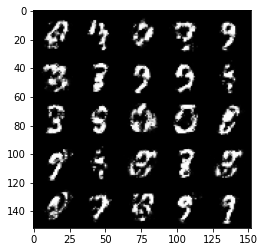

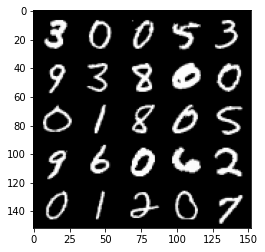

Epoch 108, step 51000: Generator loss: 1.9133556051254312, discriminator loss: 0.3337689906954766


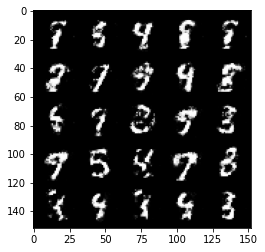

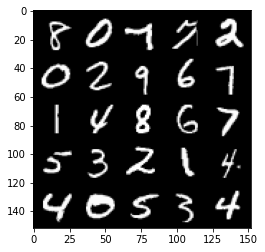

Epoch 109, step 51500: Generator loss: 1.9134428634643559, discriminator loss: 0.3381115861833094


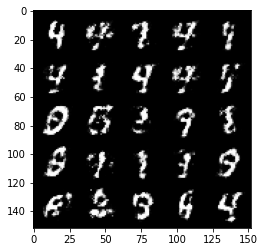

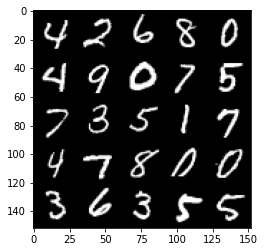

Epoch 110, step 52000: Generator loss: 1.8408214244842545, discriminator loss: 0.3520104173719882


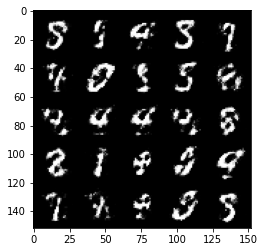

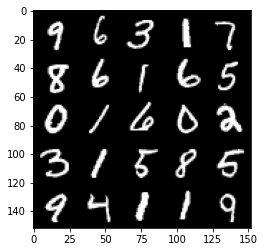

Epoch 111, step 52500: Generator loss: 1.8191064069271068, discriminator loss: 0.3608421348035336


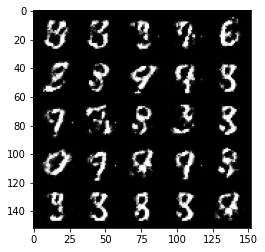

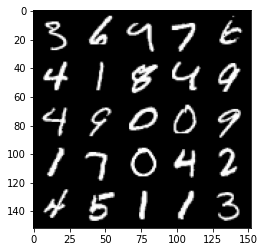

Epoch 113, step 53000: Generator loss: 1.7672920610904703, discriminator loss: 0.3685541685223582


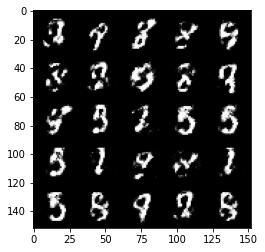

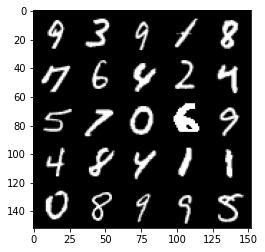

Epoch 114, step 53500: Generator loss: 1.7893856050968155, discriminator loss: 0.3562709994912151


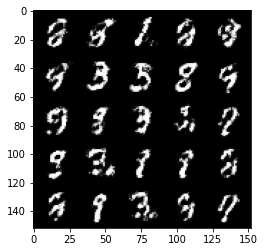

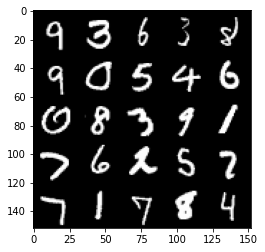

Epoch 115, step 54000: Generator loss: 1.8127162199020401, discriminator loss: 0.3552237759828571


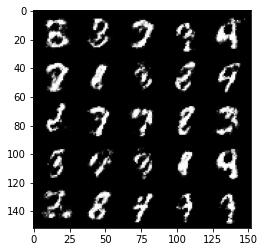

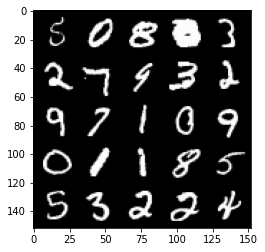

Epoch 116, step 54500: Generator loss: 1.6438243663311005, discriminator loss: 0.4024640565514569


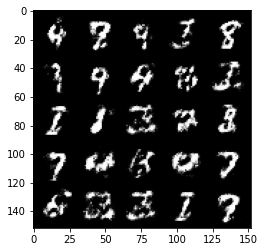

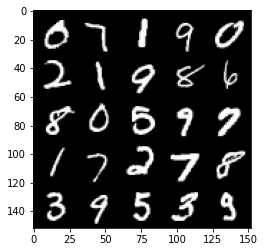

Epoch 117, step 55000: Generator loss: 1.6136419029235844, discriminator loss: 0.40001188749074973


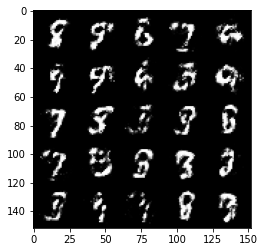

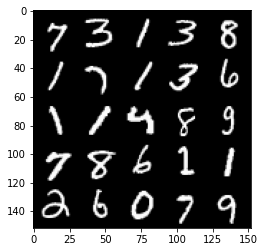

Epoch 118, step 55500: Generator loss: 1.6893474700450892, discriminator loss: 0.3797599900364878


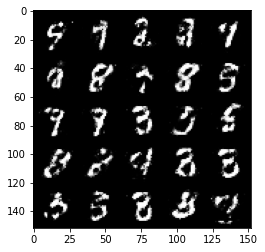

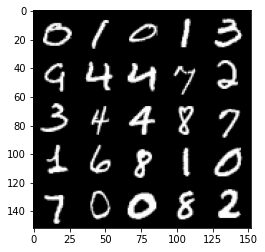

Epoch 119, step 56000: Generator loss: 1.7207260642051687, discriminator loss: 0.3639075494408611


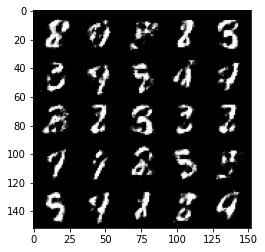

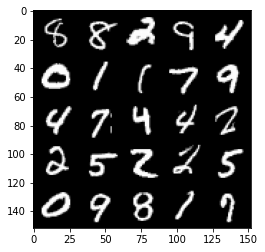

Epoch 120, step 56500: Generator loss: 1.7263788108825695, discriminator loss: 0.37556582438945807


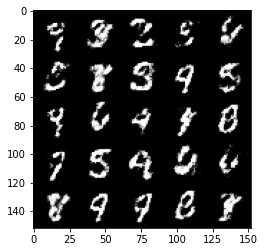

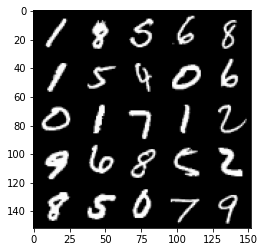

Epoch 121, step 57000: Generator loss: 1.5181545703411095, discriminator loss: 0.4263967822790147


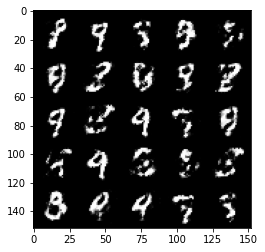

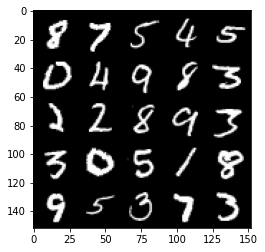

Epoch 122, step 57500: Generator loss: 1.6022851564884184, discriminator loss: 0.4097665948867795


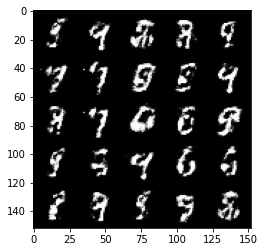

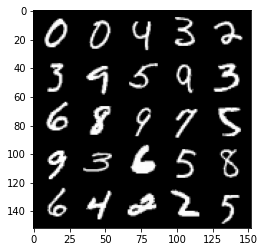

Epoch 123, step 58000: Generator loss: 1.750823887586594, discriminator loss: 0.34993029561638866


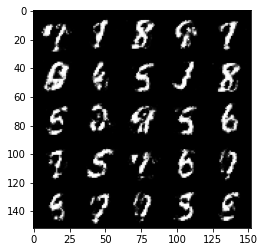

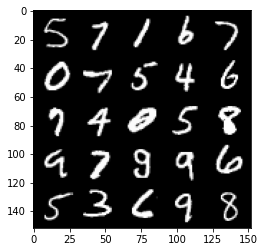

Epoch 124, step 58500: Generator loss: 1.8849768335819235, discriminator loss: 0.31908531016111397


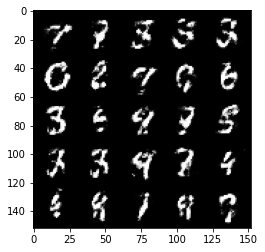

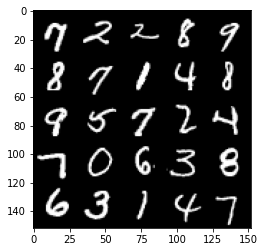

Epoch 125, step 59000: Generator loss: 1.772704833745957, discriminator loss: 0.3579743857383732


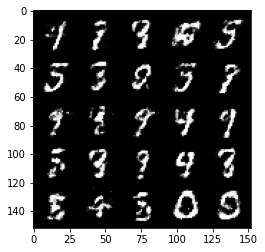

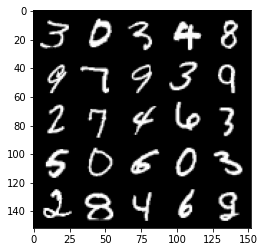

Epoch 126, step 59500: Generator loss: 1.6391903479099252, discriminator loss: 0.3796811006665232


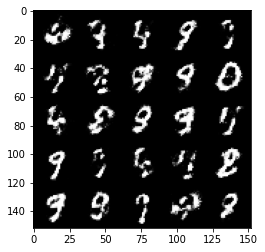

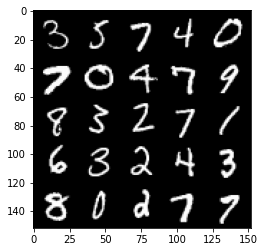

Epoch 127, step 60000: Generator loss: 1.6763620395660386, discriminator loss: 0.36431444865465157


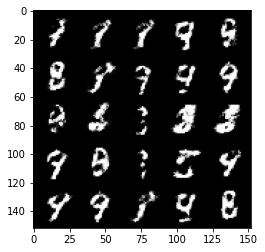

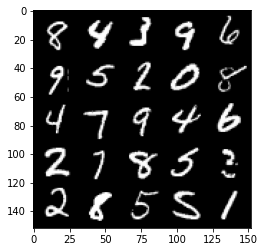

Epoch 128, step 60500: Generator loss: 1.68307584452629, discriminator loss: 0.3759004328846933


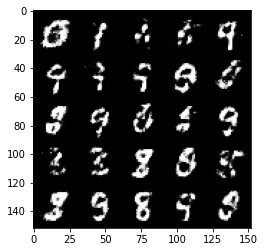

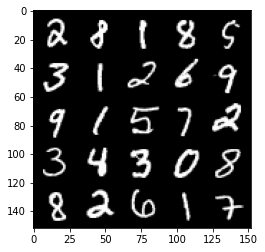

Epoch 130, step 61000: Generator loss: 1.6414635252952579, discriminator loss: 0.3709137708544734


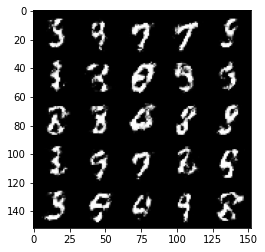

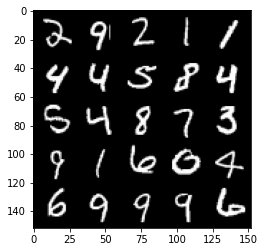

Epoch 131, step 61500: Generator loss: 1.715375685691832, discriminator loss: 0.36702711945772176


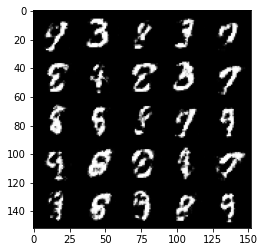

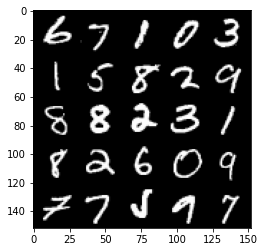

Epoch 132, step 62000: Generator loss: 1.7356205427646636, discriminator loss: 0.36188695165514945


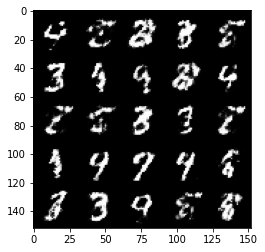

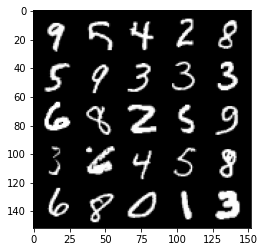

Epoch 133, step 62500: Generator loss: 1.6132587451934808, discriminator loss: 0.40392580568790376


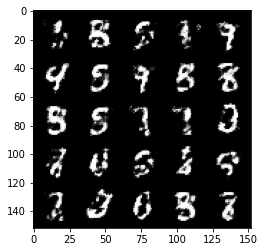

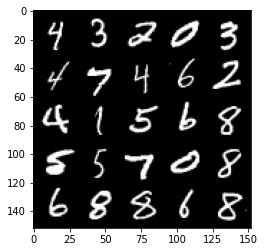

Epoch 134, step 63000: Generator loss: 1.7119148383140568, discriminator loss: 0.3632078106105324


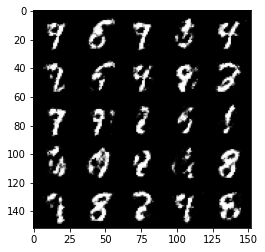

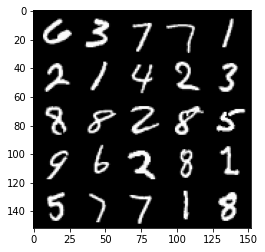

Epoch 135, step 63500: Generator loss: 1.6943098256587965, discriminator loss: 0.36545628565549826


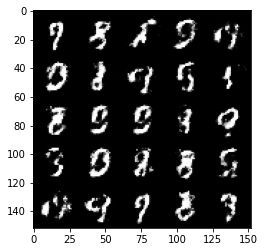

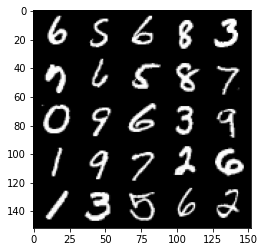

Epoch 136, step 64000: Generator loss: 1.6692203810214985, discriminator loss: 0.3815894681811337


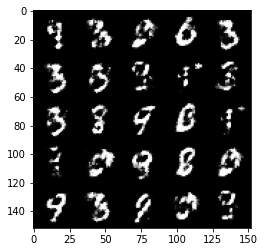

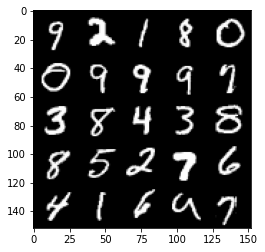

Epoch 137, step 64500: Generator loss: 1.719589728832245, discriminator loss: 0.36242923474311817


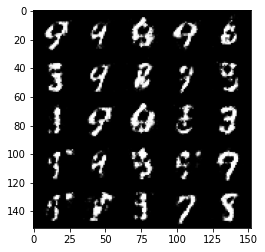

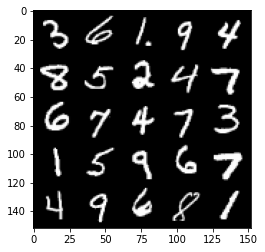

Epoch 138, step 65000: Generator loss: 1.609436199665071, discriminator loss: 0.40189972388744366


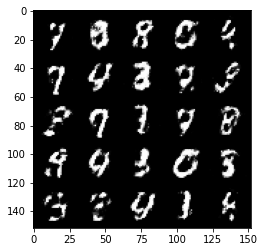

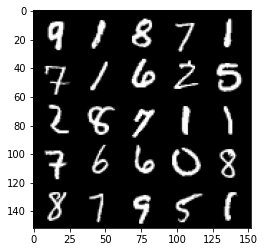

Epoch 139, step 65500: Generator loss: 1.5206191129684439, discriminator loss: 0.4162369941473008


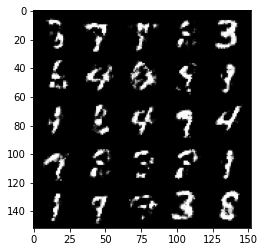

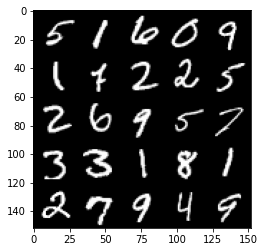

Epoch 140, step 66000: Generator loss: 1.55514815568924, discriminator loss: 0.40925173497200046


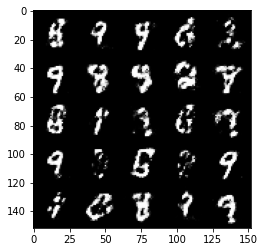

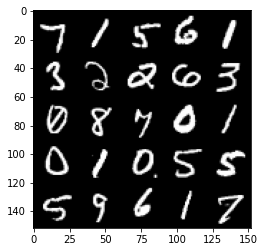

Epoch 141, step 66500: Generator loss: 1.5775577278137216, discriminator loss: 0.39290740638971305


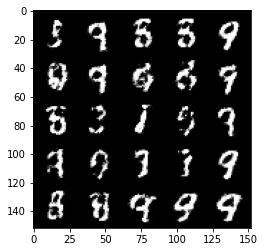

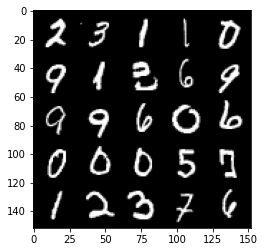

Epoch 142, step 67000: Generator loss: 1.5615019662380212, discriminator loss: 0.4173390590548517


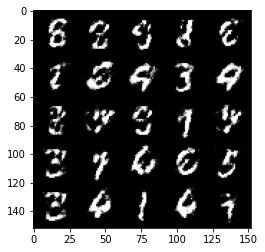

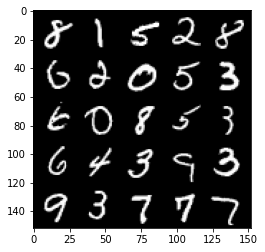

Epoch 143, step 67500: Generator loss: 1.5225053594112403, discriminator loss: 0.41410467624664316


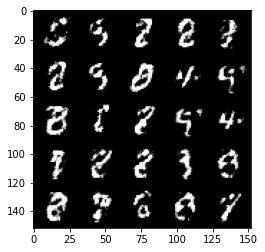

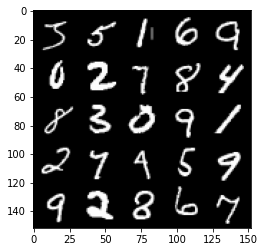

Epoch 144, step 68000: Generator loss: 1.6349620392322548, discriminator loss: 0.3745633639097211


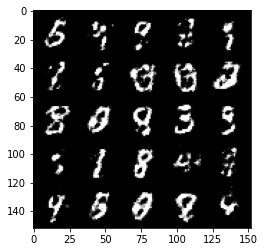

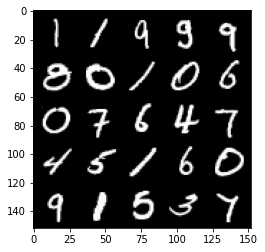

Epoch 146, step 68500: Generator loss: 1.5648380436897271, discriminator loss: 0.4056242426633833


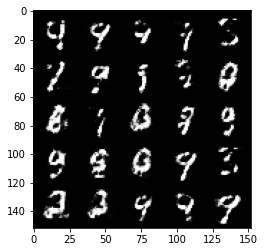

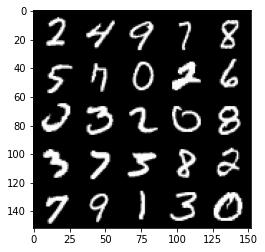

Epoch 147, step 69000: Generator loss: 1.4877797193527225, discriminator loss: 0.41514432370662635


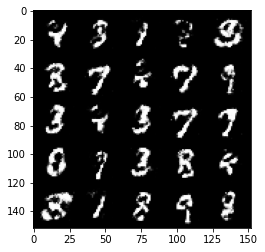

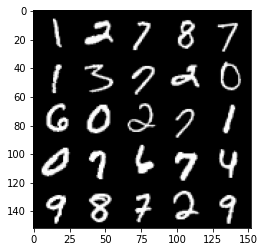

Epoch 148, step 69500: Generator loss: 1.4878481304645534, discriminator loss: 0.4136339129209522


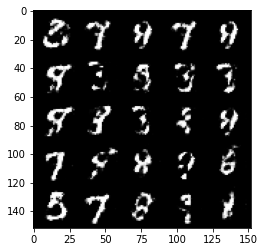

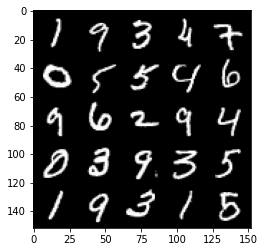

Epoch 149, step 70000: Generator loss: 1.5221370255947122, discriminator loss: 0.41224513375759136


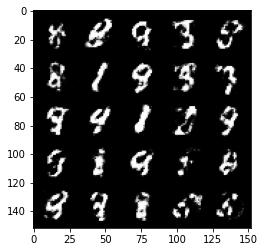

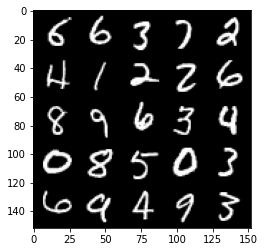

Epoch 150, step 70500: Generator loss: 1.2276110836267478, discriminator loss: 0.561981337547302


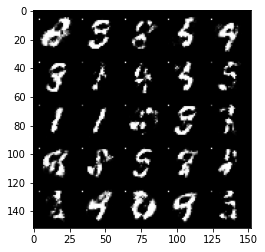

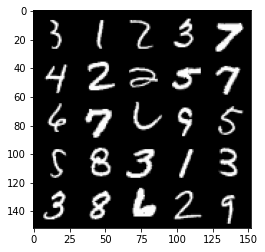

Epoch 151, step 71000: Generator loss: 1.6645847752094254, discriminator loss: 0.34640621989965437


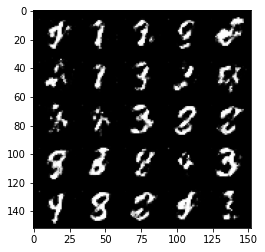

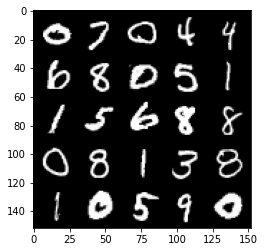

Epoch 152, step 71500: Generator loss: 1.612263045072555, discriminator loss: 0.3917760725617407


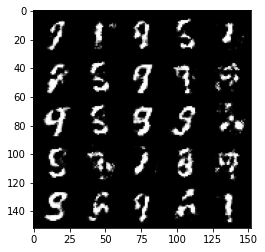

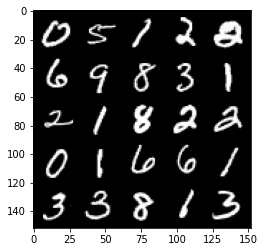

Epoch 153, step 72000: Generator loss: 1.5267587513923633, discriminator loss: 0.4136247884035116


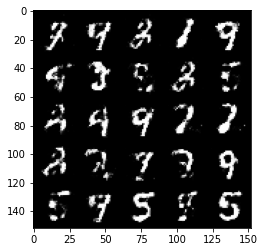

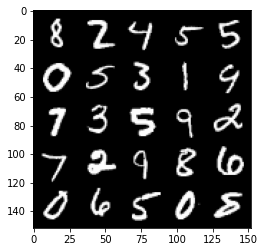

Epoch 154, step 72500: Generator loss: 1.424954900026322, discriminator loss: 0.4401022785902022


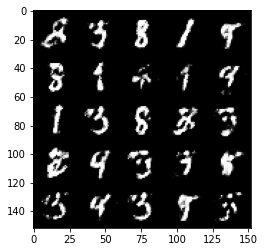

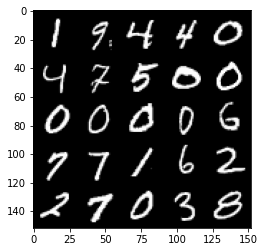

Epoch 155, step 73000: Generator loss: 1.4104021852016455, discriminator loss: 0.4367872234582903


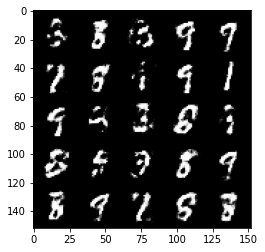

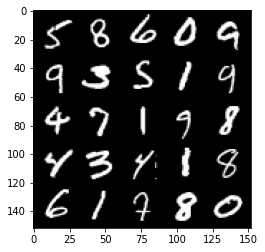

Epoch 156, step 73500: Generator loss: 1.4697637903690337, discriminator loss: 0.41683481591939936


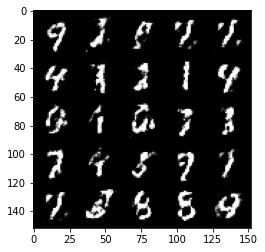

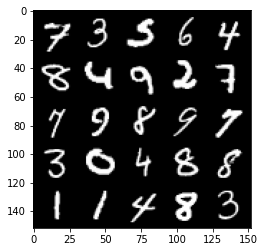

Epoch 157, step 74000: Generator loss: 1.5331041669845566, discriminator loss: 0.4069557849168784


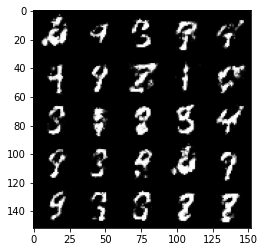

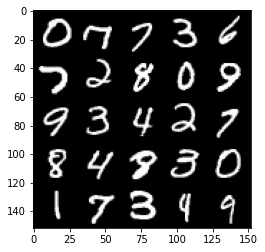

Epoch 158, step 74500: Generator loss: 1.3986518356800084, discriminator loss: 0.45151659983396536


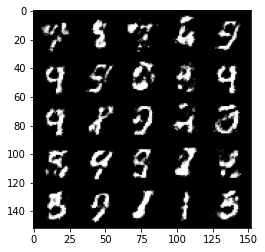

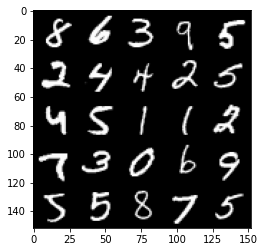

Epoch 159, step 75000: Generator loss: 1.4389516789913175, discriminator loss: 0.4319268178939824


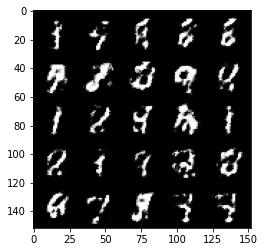

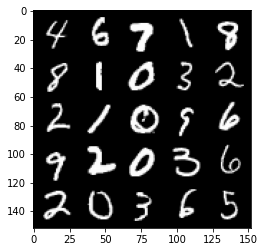

Epoch 160, step 75500: Generator loss: 1.3631608054637911, discriminator loss: 0.4461198989748958


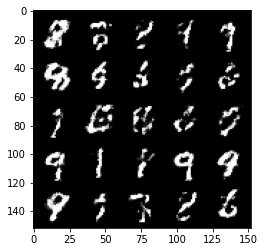

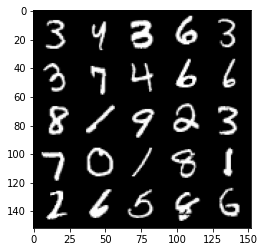

Epoch 162, step 76000: Generator loss: 1.302982849597932, discriminator loss: 0.4695084370970724


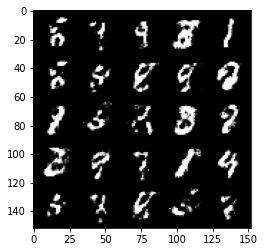

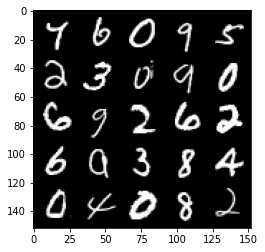

Epoch 163, step 76500: Generator loss: 1.3010890610218053, discriminator loss: 0.462316402316093


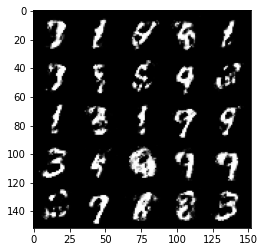

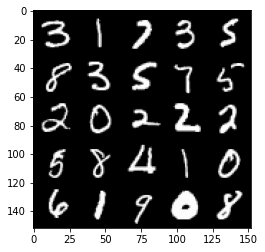

Epoch 164, step 77000: Generator loss: 1.3055131361484542, discriminator loss: 0.47576762318611193


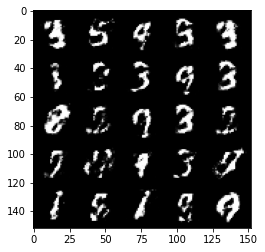

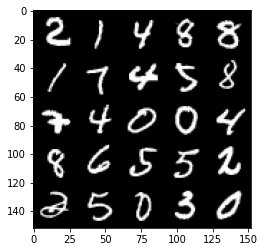

Epoch 165, step 77500: Generator loss: 1.3188591933250438, discriminator loss: 0.4603883165121081


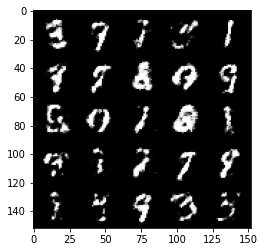

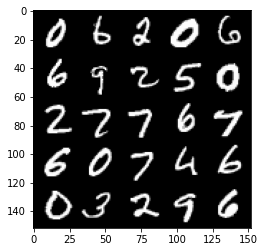

Epoch 166, step 78000: Generator loss: 1.3105735986232774, discriminator loss: 0.4608281710743903


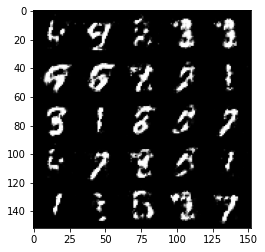

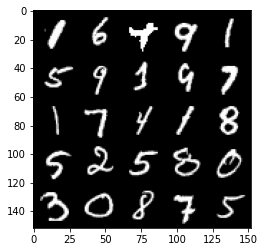

Epoch 167, step 78500: Generator loss: 1.3503004457950594, discriminator loss: 0.45704507422447216


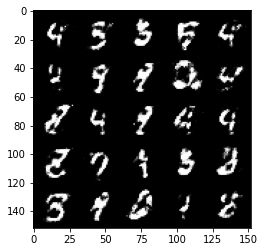

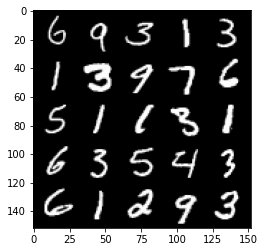

Epoch 168, step 79000: Generator loss: 1.2666725964546208, discriminator loss: 0.48893882459402044


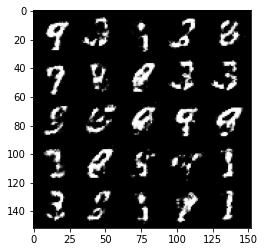

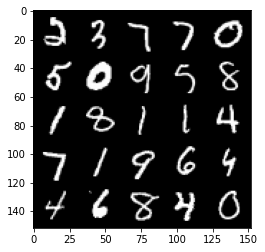

Epoch 169, step 79500: Generator loss: 1.254239027261732, discriminator loss: 0.49264966160058943


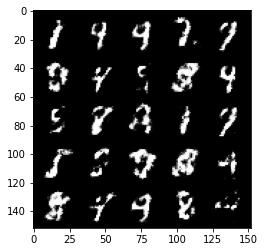

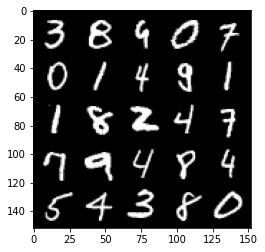

Epoch 170, step 80000: Generator loss: 1.2869867973327647, discriminator loss: 0.459400196790695


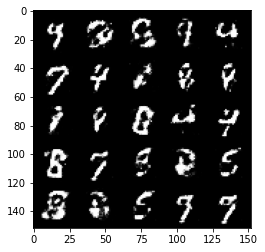

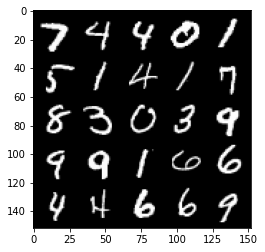

Epoch 171, step 80500: Generator loss: 1.3047073359489452, discriminator loss: 0.4843518532514575


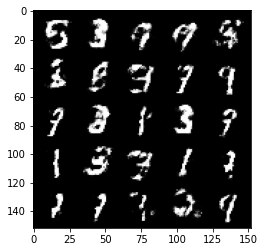

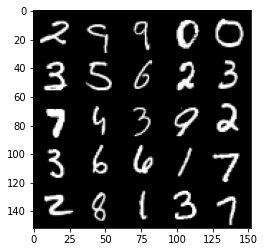

Epoch 172, step 81000: Generator loss: 1.2669144341945655, discriminator loss: 0.489111520469189


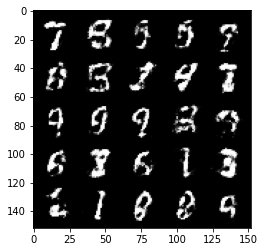

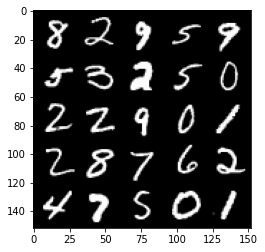

Epoch 173, step 81500: Generator loss: 1.2543438787460341, discriminator loss: 0.480157229423523


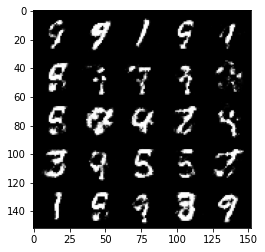

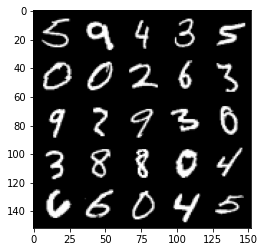

Epoch 174, step 82000: Generator loss: 1.284132370471956, discriminator loss: 0.46712638545036256


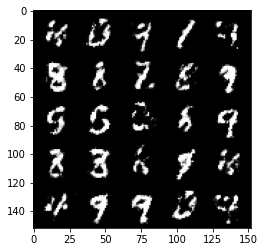

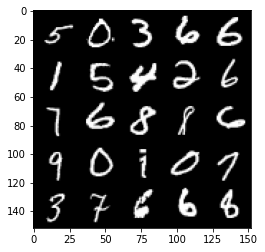

Epoch 175, step 82500: Generator loss: 1.1880475547313676, discriminator loss: 0.5053221920132636


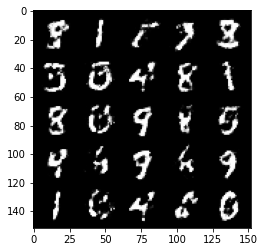

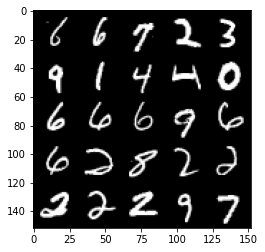

Epoch 176, step 83000: Generator loss: 1.2422108421325677, discriminator loss: 0.4800725098848343


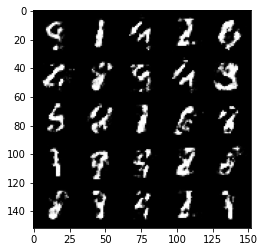

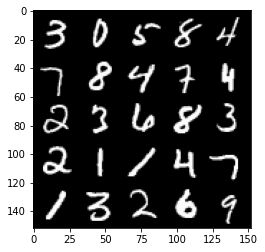

Epoch 178, step 83500: Generator loss: 1.2574040262699127, discriminator loss: 0.4844568911790846


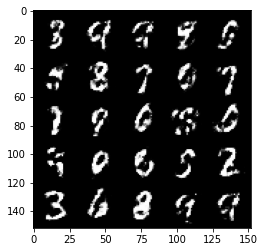

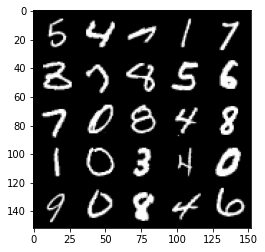

Epoch 179, step 84000: Generator loss: 1.1483260494470595, discriminator loss: 0.5265474036335945


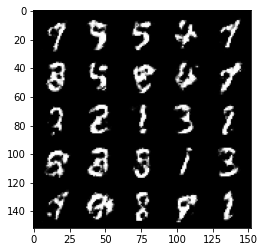

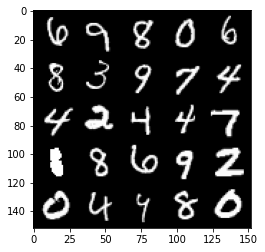

Epoch 180, step 84500: Generator loss: 1.0821401648521434, discriminator loss: 0.5423773112893105


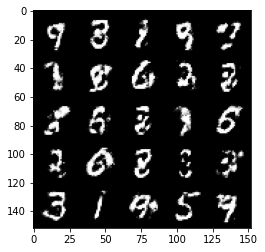

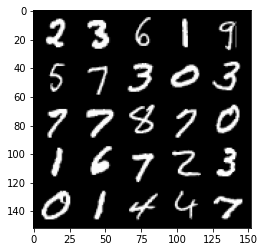

Epoch 181, step 85000: Generator loss: 1.1793938699960702, discriminator loss: 0.499041442275047


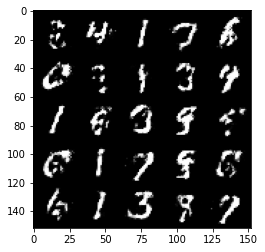

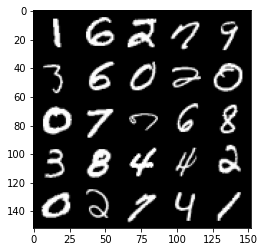

Epoch 182, step 85500: Generator loss: 1.2275224056243899, discriminator loss: 0.4827006994485851


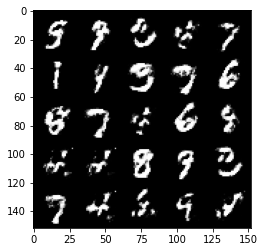

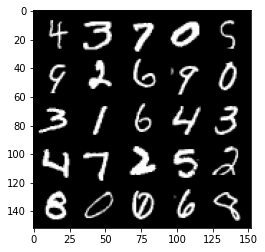

Epoch 183, step 86000: Generator loss: 1.2101972160339352, discriminator loss: 0.49093601238727563


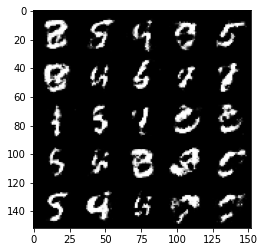

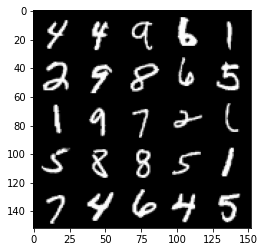

Epoch 184, step 86500: Generator loss: 1.2320911803245531, discriminator loss: 0.48586945259571096


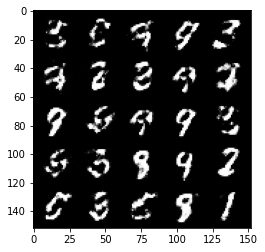

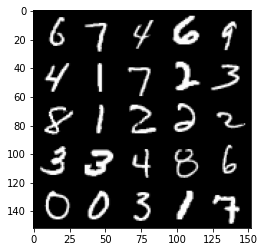

Epoch 185, step 87000: Generator loss: 1.169011031985282, discriminator loss: 0.5162406728863712


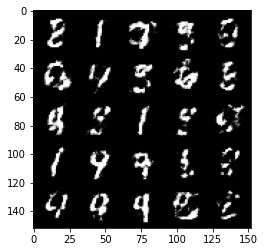

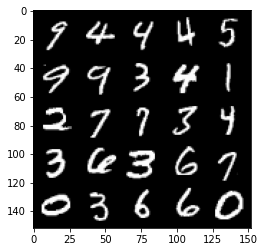

Epoch 186, step 87500: Generator loss: 1.210174946069717, discriminator loss: 0.4827680327296255


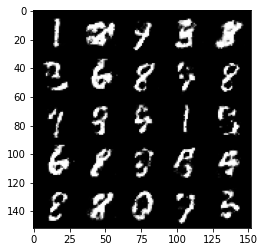

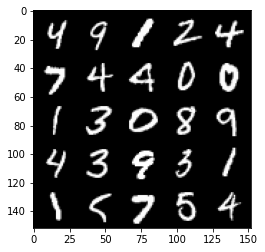

Epoch 187, step 88000: Generator loss: 1.1455577070713054, discriminator loss: 0.5221222209334371


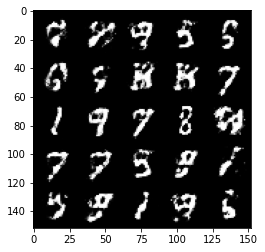

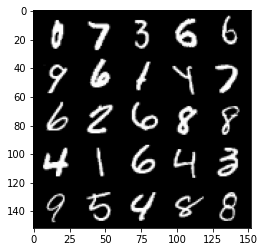

Epoch 188, step 88500: Generator loss: 1.1106112604141232, discriminator loss: 0.5339083912968637


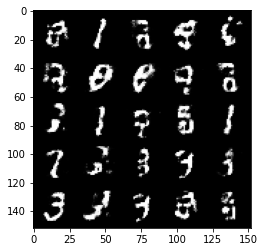

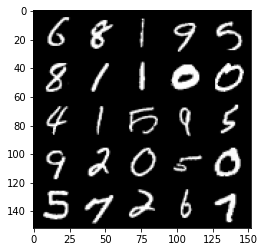

Epoch 189, step 89000: Generator loss: 1.2122503356933594, discriminator loss: 0.49431643813848497


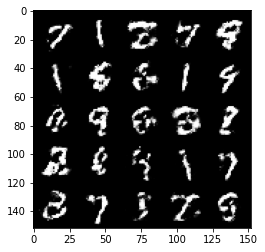

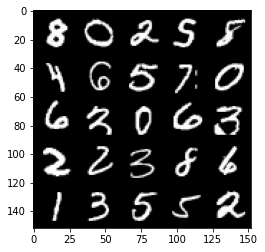

Epoch 190, step 89500: Generator loss: 1.1475982911586757, discriminator loss: 0.526834065079689


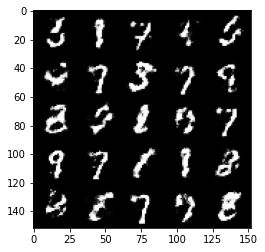

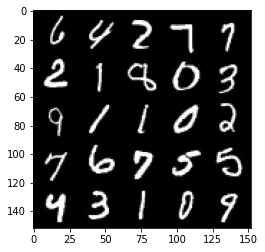

Epoch 191, step 90000: Generator loss: 1.1459653766155242, discriminator loss: 0.5209612763524055


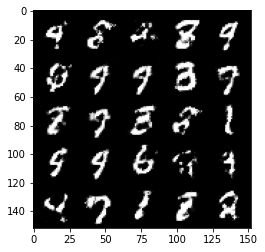

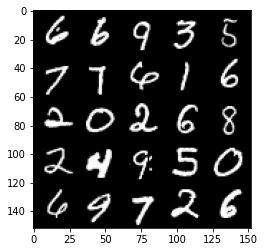

Epoch 192, step 90500: Generator loss: 1.1596803860664364, discriminator loss: 0.5168719750642777


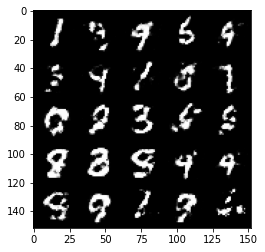

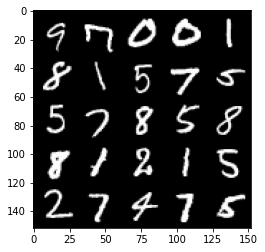

Epoch 194, step 91000: Generator loss: 1.1325937095880496, discriminator loss: 0.5226051813960079


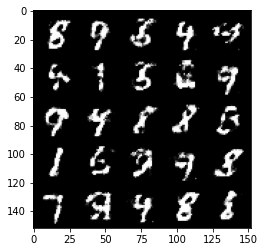

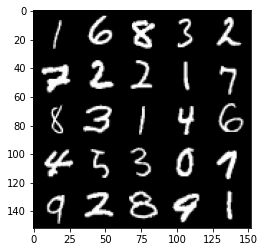

Epoch 195, step 91500: Generator loss: 1.125454763174057, discriminator loss: 0.5213647027611732


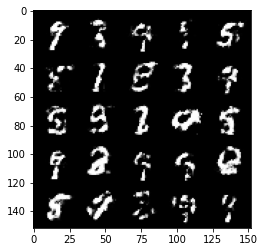

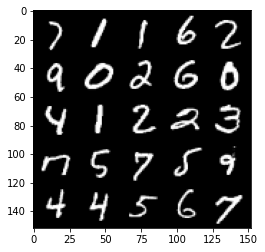

Epoch 196, step 92000: Generator loss: 1.134866026163101, discriminator loss: 0.5065052196979519


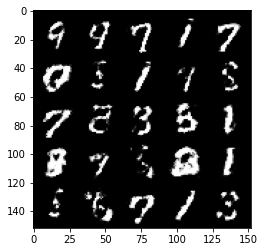

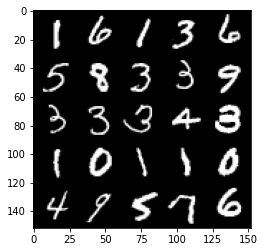

Epoch 197, step 92500: Generator loss: 1.149436764121054, discriminator loss: 0.5027637166976928


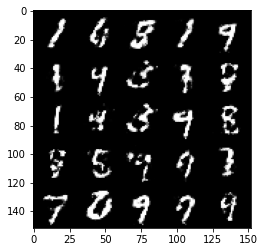

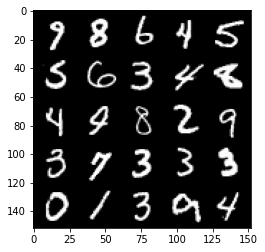

Epoch 198, step 93000: Generator loss: 1.1394420697689054, discriminator loss: 0.5224914916157722


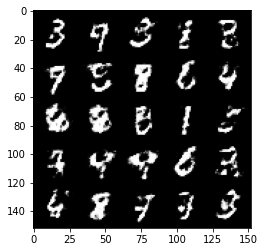

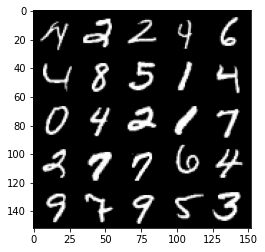

Epoch 199, step 93500: Generator loss: 1.0724293937683105, discriminator loss: 0.5433023805022237


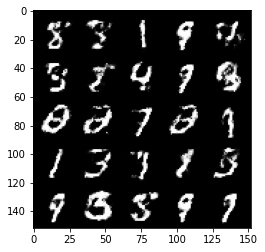

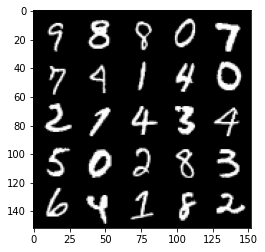

In [19]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Epoch {epoch}, step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
